# How can we use machine learning to predict the Airbnb housing prices in the UK?

## 1. Introduction

### 1.1 Background

### 1.2 Research Question and Objectives

## 2. Literature Review

### 2.1 The Context of Airbnb and Short-term Rentals

### 2.2 Relationship between Airbnb and Gentrification 

### 2.3 Regulatory Reponses and Policy Implications

### 2.4 Models for Predicting Airbnb Housing Prices

### 2.5 Conclusion

## 3. Methodology

### 3.1 Import Data

In [1]:
# Import basic packeges
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy import stats
%matplotlib inline

import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [2]:
# Import the dataset
df1 = pd.read_csv('listings_Ldn.csv')

In [3]:
df1 = df1.drop(['host_name','host_id', 'id'], axis=1)

In [4]:
df1.head()

,name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,Rental unit in London · ★4.32 · 2 bedrooms · 3...,NaN,Hackney,51.52748,-0.08172,Entire home/apt,156,2,20,2017-05-31,0.25,1,4,0,NaN
1,Rental unit in London · 2 bedrooms · 2 beds · ...,NaN,Westminster,51.48970,-0.13911,Entire home/apt,83,2,1,2016-01-12,0.01,1,0,0,NaN
2,Rental unit in Dagenham · ★4.0 · 1 bedroom · 1...,NaN,Barking and Dagenham,51.54072,0.15246,Private room,41,4,3,2012-05-27,0.02,1,365,0,NaN
3,Townhouse in Hammersmith · ★4.71 · 1 bedroom ·...,NaN,Hammersmith and Fulham,51.48974,-0.22208,Private room,69,4,175,2023-05-02,1.21,1,67,10,NaN
4,Rental unit in Islington · ★4.80 · 1 bedroom ·...,NaN,Islington,51.56861,-0.11270,Private room,79,1,41,2022-12-11,0.26,2,353,15,NaN


In [5]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81792 entries, 0 to 81791
Data columns (total 15 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   name                            81792 non-null  object 
 1   neighbourhood_group             0 non-null      float64
 2   neighbourhood                   81792 non-null  object 
 3   latitude                        81792 non-null  float64
 4   longitude                       81792 non-null  float64
 5   room_type                       81792 non-null  object 
 6   price                           81792 non-null  int64  
 7   minimum_nights                  81792 non-null  int64  
 8   number_of_reviews               81792 non-null  int64  
 9   last_review                     61190 non-null  object 
 10  reviews_per_month               61190 non-null  float64
 11  calculated_host_listings_count  81792 non-null  int64  
 12  availability_365                

In [6]:
df1.describe()

,neighbourhood_group,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
count,0.0,81792.000000,81792.000000,81792.000000,81792.000000,81792.000000,61190.000000,81792.000000,81792.000000,81792.000000,0.0
mean,NaN,51.509636,-0.128096,187.537204,5.649746,17.941804,0.970620,16.845535,119.303697,5.907448,NaN
std,NaN,0.048543,0.099242,477.437210,23.002885,42.243186,1.331123,58.645477,133.867681,12.966562,NaN
min,NaN,51.295937,-0.497800,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000,0.000000,NaN
25%,NaN,51.483593,-0.189168,61.000000,1.000000,0.000000,0.140000,1.000000,0.000000,0.000000,NaN
50%,NaN,51.513840,-0.126575,110.000000,2.000000,4.000000,0.500000,1.000000,59.000000,1.000000,NaN
75%,NaN,51.539468,-0.068390,198.000000,4.000000,16.000000,1.230000,5.000000,245.000000,6.000000,NaN
max,NaN,51.681502,0.288570,58564.000000,1125.000000,1425.000000,50.500000,543.000000,365.000000,531.000000,NaN


### 3.2 Data preprocessing and cleaning

In [7]:
# delete unralated features
df1 = df1.drop(['neighbourhood_group','license'], axis=1)

In [8]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81792 entries, 0 to 81791
Data columns (total 13 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   name                            81792 non-null  object 
 1   neighbourhood                   81792 non-null  object 
 2   latitude                        81792 non-null  float64
 3   longitude                       81792 non-null  float64
 4   room_type                       81792 non-null  object 
 5   price                           81792 non-null  int64  
 6   minimum_nights                  81792 non-null  int64  
 7   number_of_reviews               81792 non-null  int64  
 8   last_review                     61190 non-null  object 
 9   reviews_per_month               61190 non-null  float64
 10  calculated_host_listings_count  81792 non-null  int64  
 11  availability_365                81792 non-null  int64  
 12  number_of_reviews_ltm           

In [9]:
df1.shape

(81792, 13)

#### 3.2.1 Missing values

In [10]:
# Categorical features
# Fill missing value var mode
col_mode = ['name','neighbourhood','room_type','last_review']
for col in col_mode:
    df1[col].fillna(df1[col].mode()[0],inplace=True)
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81792 entries, 0 to 81791
Data columns (total 13 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   name                            81792 non-null  object 
 1   neighbourhood                   81792 non-null  object 
 2   latitude                        81792 non-null  float64
 3   longitude                       81792 non-null  float64
 4   room_type                       81792 non-null  object 
 5   price                           81792 non-null  int64  
 6   minimum_nights                  81792 non-null  int64  
 7   number_of_reviews               81792 non-null  int64  
 8   last_review                     81792 non-null  object 
 9   reviews_per_month               61190 non-null  float64
 10  calculated_host_listings_count  81792 non-null  int64  
 11  availability_365                81792 non-null  int64  
 12  number_of_reviews_ltm           

In [11]:
# numerical features
# df1 = df1.fillna(axis=0,subset=['reviews_per_month'], how="any")
df1["reviews_per_month"].fillna(df1["reviews_per_month"].mean(),inplace=True)
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81792 entries, 0 to 81791
Data columns (total 13 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   name                            81792 non-null  object 
 1   neighbourhood                   81792 non-null  object 
 2   latitude                        81792 non-null  float64
 3   longitude                       81792 non-null  float64
 4   room_type                       81792 non-null  object 
 5   price                           81792 non-null  int64  
 6   minimum_nights                  81792 non-null  int64  
 7   number_of_reviews               81792 non-null  int64  
 8   last_review                     81792 non-null  object 
 9   reviews_per_month               81792 non-null  float64
 10  calculated_host_listings_count  81792 non-null  int64  
 11  availability_365                81792 non-null  int64  
 12  number_of_reviews_ltm           

#### 3.2.2 Outliers

In [12]:
def identifying_treating_outliers(df,col,remove_or_fill_with_quartile):
  q1=df[col].quantile(0.25)
  q3=df[col].quantile(0.75)
  iqr=q3-q1
 
  lower_fence=q1-1.5*(iqr)
  upper_fence=q3+1.5*(iqr)
 
  print('Lower Fence;', lower_fence)
  print('Upper Fence:', upper_fence)
#   print('Total number of outliers are left:', df[df[col]  upper_fence].shape[0])
 
  if remove_or_fill_with_quartile=="drop":
    df.drop(df.loc[df[col]<lower_fence].index,inplace=True)
    df.drop(df.loc[df[col]>upper_fence].index,inplace=True)
 
  elif remove_or_fill_with_quartile=="fill":
    df[col] = np.where(df[col] < lower_fence, lower_fence, df[col])
    df[col] = np.where(df[col] > upper_fence, upper_fence, df[col])

Lower Fence; -144.5
Upper Fence: 403.5


(75860, 13)

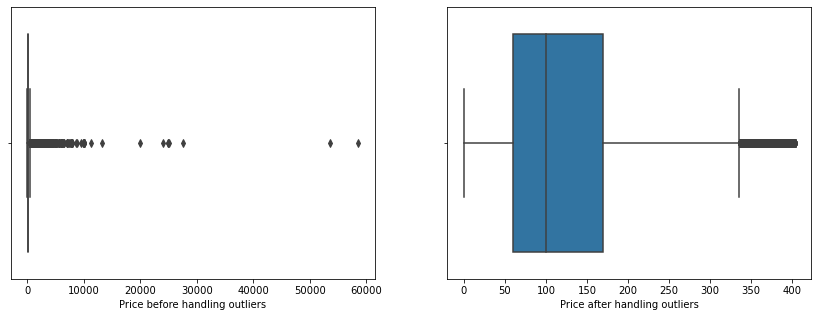

In [13]:
plt.figure(figsize=(30,5))
plt.subplot(1,4,1)
sns.boxplot(x = df1['price'])
plt.xlabel('Price before handling outliers')

identifying_treating_outliers(df1,'price','drop')
plt.subplot(1,4,2)
sns.boxplot(x = df1['price'])
plt.xlabel('Price after handling outliers')

df1.shape

Lower Fence; -3.5
Upper Fence: 8.5


(69682, 13)

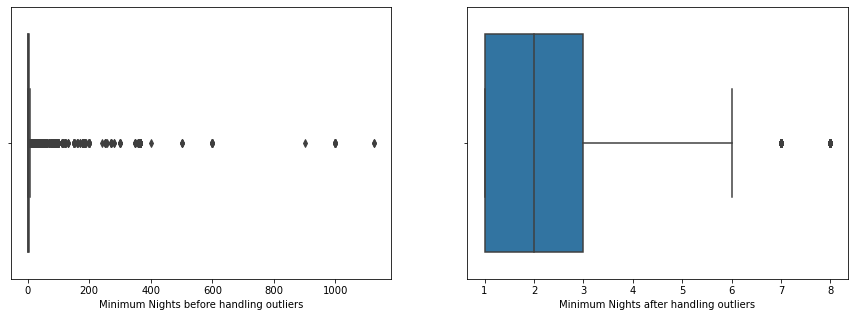

In [14]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.boxplot(x= df1['minimum_nights'])
plt.xlabel('Minimum Nights before handling outliers')

identifying_treating_outliers(df1,'minimum_nights','drop')
plt.subplot(1,2,2)
sns.boxplot(x = df1['minimum_nights'])
plt.xlabel('Minimum Nights after handling outliers')
df1.shape

Lower Fence; -3.5
Upper Fence: 8.5


(58075, 13)

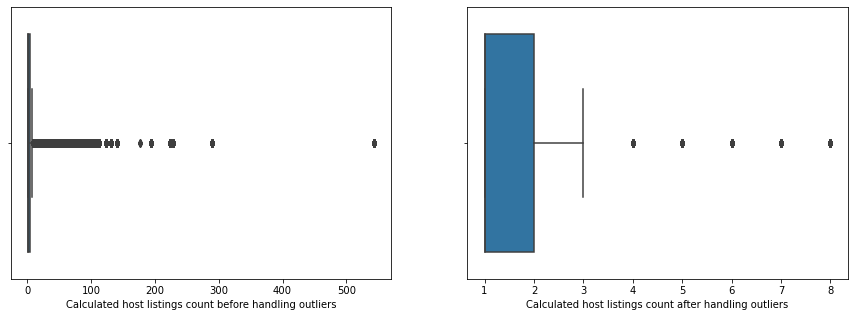

In [15]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.boxplot(x = df1['calculated_host_listings_count'])
plt.xlabel('Calculated host listings count before handling outliers')

identifying_treating_outliers(df1,'calculated_host_listings_count','drop')
plt.subplot(1,2,2)
sns.boxplot(x = df1['calculated_host_listings_count'])
plt.xlabel('Calculated host listings count after handling outliers')
df1.shape

Lower Fence; -0.9809302990685191
Upper Fence: 2.1415504984475318


(52537, 13)

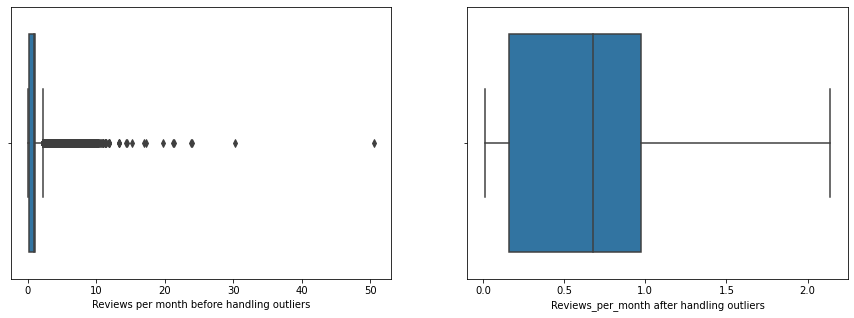

In [16]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.boxplot(x= df1['reviews_per_month'])
plt.xlabel('Reviews per month before handling outliers')

identifying_treating_outliers(df1,'reviews_per_month','drop')
plt.subplot(1,2,2)
sns.boxplot(x = df1['reviews_per_month'])
plt.xlabel('Reviews_per_month after handling outliers')
df1.shape

Lower Fence; -21.0
Upper Fence: 35.0


(46482, 13)

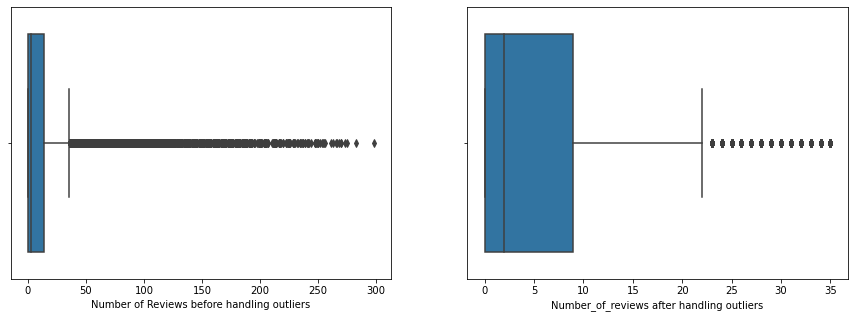

In [17]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.boxplot(x = df1['number_of_reviews'])
plt.xlabel('Number of Reviews before handling outliers')

identifying_treating_outliers(df1,'number_of_reviews','drop')
plt.subplot(1,2,2)
sns.boxplot(x = df1['number_of_reviews'])
plt.xlabel('Number_of_reviews after handling outliers')
df1.shape

Lower Fence; -250.5
Upper Fence: 417.5


(46482, 13)

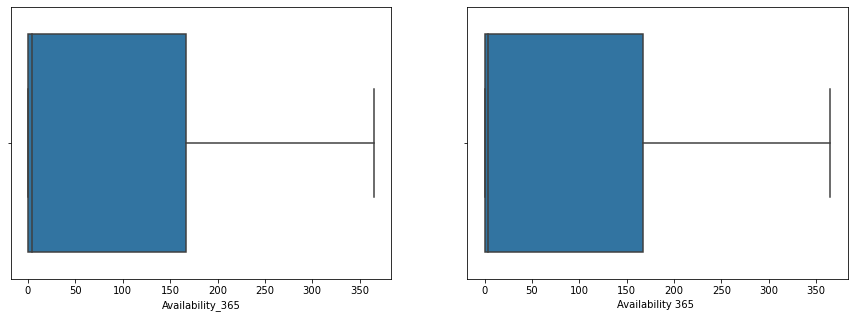

In [18]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,2)
sns.boxplot(x= df1['availability_365'])
plt.xlabel('Availability 365 ')

identifying_treating_outliers(df1,'availability_365','drop')
plt.subplot(1,2,1)
sns.boxplot(x = df1['availability_365'])
plt.xlabel('Availability_365')
df1.shape

### 3.3 Exploratory data analysis and feature selection

In [19]:
# df1 = df1.drop(['latitude','longitude'], axis=1)
df1.describe()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
count,46482.000000,46482.000000,46482.000000,46482.000000,46482.000000,46482.000000,46482.000000,46482.000000,46482.000000
mean,51.508996,-0.121536,116.021578,2.677897,6.114840,0.609108,1.805301,92.521987,2.273461
std,0.052647,0.104491,81.616862,1.745861,8.169544,0.496828,1.523028,128.996834,4.359205
min,51.297899,-0.497800,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000,0.000000
25%,51.475472,-0.190116,55.000000,1.000000,0.000000,0.130000,1.000000,0.000000,0.000000
50%,51.514390,-0.115151,94.000000,2.000000,2.000000,0.560000,1.000000,4.000000,0.000000
75%,51.544250,-0.058283,153.000000,3.000000,9.000000,0.970620,2.000000,167.000000,3.000000
max,51.681502,0.268210,403.000000,8.000000,35.000000,2.140000,8.000000,365.000000,33.000000


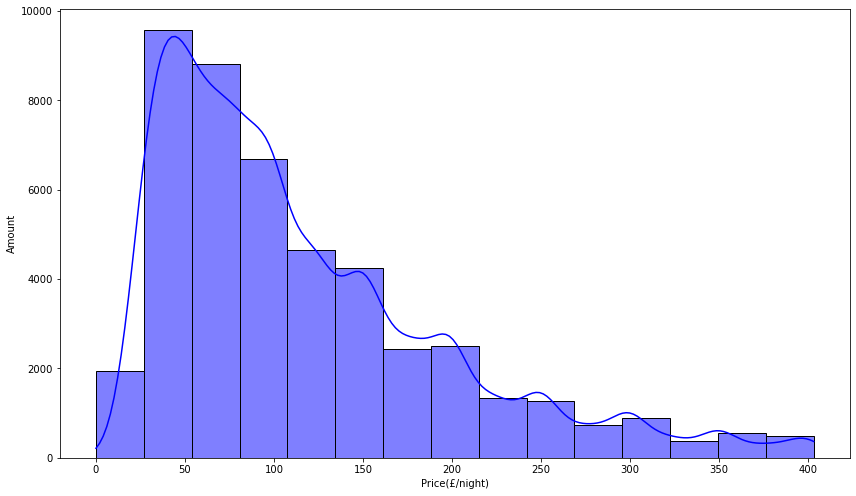

In [20]:
plt.figure(figsize=(12, 7))
sns.histplot(df1['price'], bins=15, kde=True, color='blue')

# Add labels and title
plt.xlabel('Price(£/night)')
plt.ylabel('Amount')


# Show the plot
plt.tight_layout()
plt.show()

In [21]:
df1['room_type'].value_counts()

Entire home/apt    26498
Private room       19647
Shared room          267
Hotel room            70
Name: room_type, dtype: int64

[Text(0.5, 1.0, 'Percentage of Airbnb listings by room type'),
 Text(0.5, 0, 'Room type'),
 Text(0, 0.5, '')]

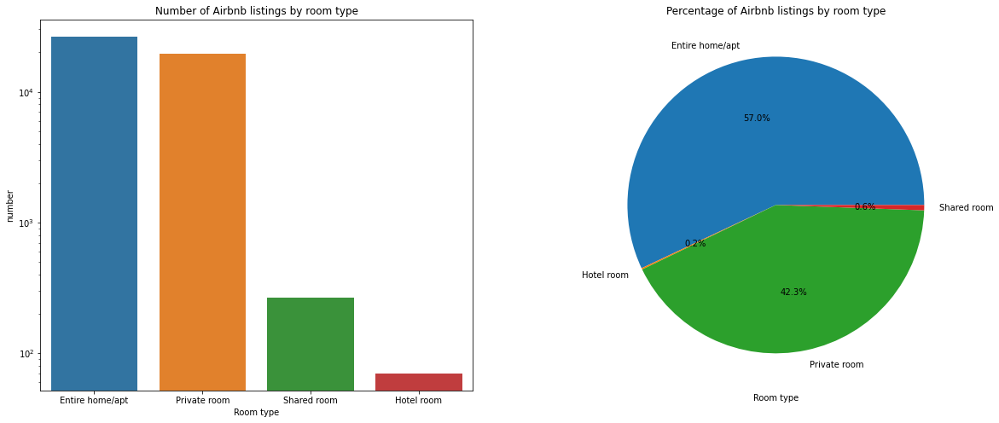

In [22]:
fig, ax = plt.subplots(1, 2,figsize=(20,8), squeeze=False)
room_order= df1.groupby('room_type')['name'].count().sort_values(ascending=False).index
piedata2 = df1.groupby('room_type')['name'].count()
sns.countplot(x='room_type', data=df1, order=room_order, ax=ax[0,0]).set(title='Number of Airbnb listings by room type',xlabel='Room type',ylabel='number')
                                                        
ax[0,0].set_yscale('log')
piedata2.plot(kind='pie', autopct='%1.1f%%', ax=ax[0,1]).set(title='Percentage of Airbnb listings by room type', xlabel='Room type' ,ylabel=None)

In [23]:
mean_price_by_room_type = df1.pivot_table(
    index='room_type',
    values='price',
    aggfunc='mean',
    fill_value=0
).sort_values(by='price', ascending=False)


fig = px.bar(
    mean_price_by_room_type,
    text_auto=True,
    
)

fig.show()

In [24]:
df1['neighbourhood'].value_counts()

Hackney                   4111
Tower Hamlets             3896
Westminster               3120
Southwark                 2788
Lambeth                   2747
Islington                 2732
Wandsworth                2707
Camden                    2400
Kensington and Chelsea    2025
Hammersmith and Fulham    1943
Lewisham                  1754
Haringey                  1442
Brent                     1420
Newham                    1264
Barnet                    1247
Ealing                    1240
Greenwich                 1138
Waltham Forest            1104
Merton                     978
Croydon                    905
Richmond upon Thames       739
Hounslow                   692
Redbridge                  575
Bromley                    499
Enfield                    491
Hillingdon                 456
Kingston upon Thames       448
Barking and Dagenham       351
Bexley                     345
Harrow                     311
Havering                   258
Sutton                     222
City of 

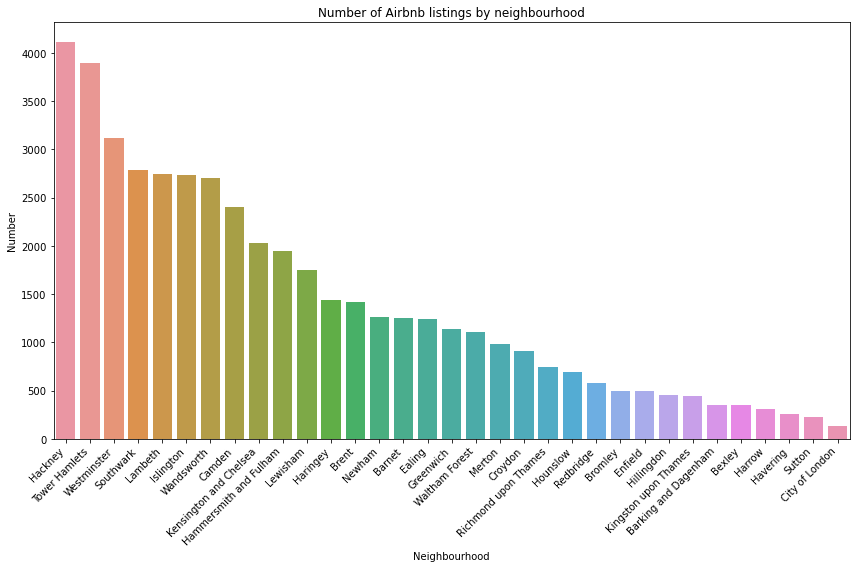

In [25]:
fig, ax = plt.subplots(1, 1,figsize=(12,8), squeeze=False)
room_order= df1.groupby('neighbourhood')['name'].count().sort_values(ascending=False).index

count_plot = sns.countplot(x='neighbourhood', data=df1, order=room_order, ax=ax[0, 0])
count_plot.set(title='Number of Airbnb listings by neighbourhood', xlabel='Neighbourhood', ylabel='Number')
# Rotate x-axis labels by 45 degrees
count_plot.set_xticklabels(count_plot.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

In [26]:
mean_price_by_nei = df1.pivot_table(
    index='neighbourhood',
    values='price',
    aggfunc='mean',
    fill_value=0
).sort_values(by='price', ascending=False)


fig = px.bar(
    mean_price_by_nei,
    text_auto=True,
    
)

fig.update_xaxes(tickangle=45)

fig.show(figsize=(20,8))

In [27]:
# lat_mean = df1['latitude'].mean()
# long_mean = df1['longitude'].mean()
# area_lat = df1['latitude'].groupby(df1['neighbourhood']).mean()
# area_long = df1['longitude'].groupby(df1['neighbourhood']).mean()
# room_order= df1.groupby('neighbourhood')['name'].count().sort_values(ascending=False).index
# area_lat_long= pd.concat([area_lat,area_long],axis=1)
# area_lat_long = area_lat_long.values.tolist()

# import folium
# map = folium.Map(
#                   # Center the map here
#                   location=[lat_mean,long_mean],
#                   zoom_start = 10.3
#                 )  
# for point in range(0, len(area_lat_long)):
#   _=folium.Marker(
#                       area_lat_long[point],
#                       popup = area_lat_long[point]
#                       ).add_to(map)
# map

In [28]:
listings_per_neighbourhood_group = df1.groupby('neighbourhood')['neighbourhood'].count()
neighbourhood_lat_long = df1.groupby('neighbourhood')[['latitude', 'longitude']].mean()
fig = px.scatter_mapbox(neighbourhood_lat_long,
            lat=neighbourhood_lat_long['latitude'],
            lon=neighbourhood_lat_long['longitude'],
            hover_name=neighbourhood_lat_long.index,
            hover_data={'latitude': False, 'longitude': False},
            color_discrete_sequence=px.colors.sequential.Plasma,
            size=listings_per_neighbourhood_group.values,
            size_max=30,
            zoom=9.2,
            title='Number of listings per neighbourhood',
)

fig.update_layout(mapbox_style='open-street-map', height=700)
annotations = [
    dict(
        x=lon,
        y=lat,
        xref='x',
        yref='y',
        text=f'{size} listings',
        showarrow=False,
        font=dict(size=10)
    )
    for lat, lon, size in zip(neighbourhood_lat_long['latitude'], neighbourhood_lat_long['longitude'], listings_per_neighbourhood_group.values)
]

fig.update_layout(annotations=annotations)
fig.show()

In [29]:
# listings_per_neighbourhood_group = df1['price'].groupby(df1['neighbourhood']).mean()
# neighbourhood_lat_long = df1.groupby('neighbourhood')[['latitude', 'longitude']].mean()
# fig = px.scatter_mapbox(neighbourhood_lat_long,
#             lat=neighbourhood_group_lat_long['latitude'],
#             lon=neighbourhood_group_lat_long['longitude'],
#             hover_name=neighbourhood_group_lat_long.index,
#             hover_data={'latitude': False, 'longitude': False},
#             color_discrete_sequence=px.colors.sequential.Plasma,
#             size=listings_per_neighbourhood_group.values,
#             size_max=30,
#             zoom=9.5,
#             title='Mean price per neighbourhood',
# )

# fig.update_layout(mapbox_style='open-street-map', height=700)
# fig.show()

In [30]:
figure = px.scatter_mapbox(df1,lat="latitude",
           lon="longitude",
           opacity = 0.3,
           hover_name="neighbourhood",
           hover_data=["neighbourhood", "price"],
           color="price",
           color_discrete_sequence=px.colors.sequential.PuBuGn,
           template = "plotly_dark",
           zoom=9
           )
figure.update_layout(mapbox_style="open-street-map")
figure.update_layout(margin={"r":0,"t":0,"l":0,"b":0},font = dict(size=17,family="Franklin Gothic"))
figure.show()



In [31]:
rev_by_nei = df1.pivot_table(
    index='neighbourhood',
    values='number_of_reviews',
    aggfunc='mean',
    fill_value=0
).sort_values(by='number_of_reviews', ascending=False)


fig = px.bar(
    rev_by_nei,
    text_auto=True,
    
)

fig.update_xaxes(tickangle=45)

fig.show(figsize=(20,8))

In [32]:
# Calculate mean availability by neighbourhood
mean_ava_by_nei = df1.pivot_table(
    index='neighbourhood',
    values='availability_365',
    aggfunc='mean',
    fill_value=0
).sort_values(by='availability_365', ascending=False)

# Create the first bar chart and add it to the subplot layout
fig = px.bar(mean_ava_by_nei, text_auto=True)
fig.update_xaxes(tickangle=45)
fig.show()

In [33]:
# Calculate mean availability by room type
mean_ava_by_room_type = df1.pivot_table(
    index='room_type',
    values='availability_365',
    aggfunc='mean',
    fill_value=0
).sort_values(by='availability_365', ascending=False)

# Create the second bar chart and add it to the subplot layout
fig = px.bar(mean_ava_by_room_type, text_auto=True)
fig.show()

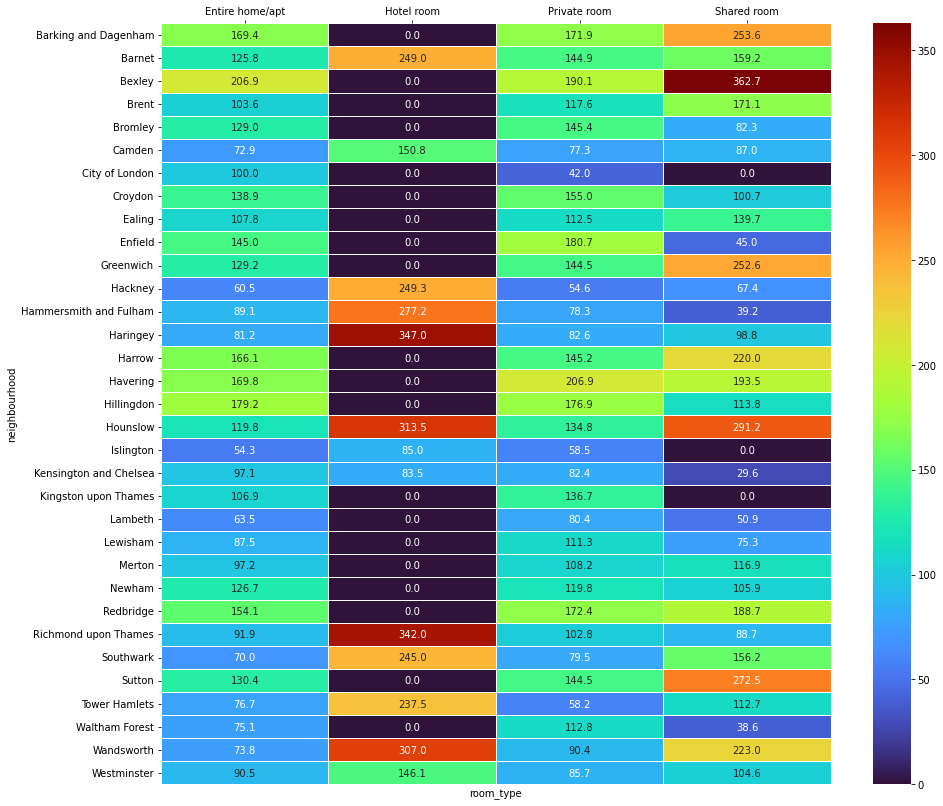

In [34]:
mean_availabilty_by_room_and_neighbourhood = df1.pivot_table(
    index='neighbourhood',
    columns='room_type',
    values='availability_365',
    aggfunc='mean',
    fill_value=0
)


fig, ax = plt.subplots(figsize=(15,14))
sns.heatmap(
    mean_availabilty_by_room_and_neighbourhood, 
    annot=True,
    fmt='.1f', 
    linewidths=1,
    cmap='turbo'
)
ax.xaxis.tick_top()

In [35]:
# fig, ax= plt.subplots(figsize=(10, 5))
# sns.scatterplot(data=df1, x='availability_365', y='price')\
#                          .set(title='Relation between Minimum of nights and price', 
#                                                          xlabel='Minimum nights', 
#                                                          ylabel='price')

### 3.4 Feature Engieering

In [36]:
from datetime import datetime
df1['last_review'] = pd.to_datetime(df1['last_review'])
current_date = datetime.now()  # Get the current date
df1['days_since_last_review'] = (current_date - df1['last_review']).dt.days
df1.head()

,name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,days_since_last_review
0,Rental unit in London · ★4.32 · 2 bedrooms · 3...,Hackney,51.52748,-0.08172,Entire home/apt,156,2,20,2017-05-31,0.25,1,4,0,2276
1,Rental unit in London · 2 bedrooms · 2 beds · ...,Westminster,51.48970,-0.13911,Entire home/apt,83,2,1,2016-01-12,0.01,1,0,0,2781
2,Rental unit in Dagenham · ★4.0 · 1 bedroom · 1...,Barking and Dagenham,51.54072,0.15246,Private room,41,4,3,2012-05-27,0.02,1,365,0,4106
10,Rental unit in Greater London · ★4.63 · 2 bedr...,Southwark,51.49185,-0.08823,Entire home/apt,111,2,10,2019-03-19,0.07,1,0,0,1619
18,Townhouse in London · ★4.89 · 5 bedrooms · 4 b...,Hackney,51.56099,-0.07740,Entire home/apt,190,3,22,2019-08-19,0.17,1,0,0,1466


In [37]:
from sklearn.preprocessing import LabelEncoder
neighbourhood_le = LabelEncoder()
df1['neighbourhood'] = neighbourhood_le.fit_transform(df1['neighbourhood'])
# df1['neighbourhood'].value_counts()

# one hot encoding
df1 = pd.get_dummies(df1, columns=['room_type'])
df1.head()

,name,neighbourhood,latitude,longitude,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,days_since_last_review,room_type_Entire home/apt,room_type_Hotel room,room_type_Private room,room_type_Shared room
0,Rental unit in London · ★4.32 · 2 bedrooms · 3...,11,51.52748,-0.08172,156,2,20,2017-05-31,0.25,1,4,0,2276,1,0,0,0
1,Rental unit in London · 2 bedrooms · 2 beds · ...,32,51.48970,-0.13911,83,2,1,2016-01-12,0.01,1,0,0,2781,1,0,0,0
2,Rental unit in Dagenham · ★4.0 · 1 bedroom · 1...,0,51.54072,0.15246,41,4,3,2012-05-27,0.02,1,365,0,4106,0,0,1,0
10,Rental unit in Greater London · ★4.63 · 2 bedr...,27,51.49185,-0.08823,111,2,10,2019-03-19,0.07,1,0,0,1619,1,0,0,0
18,Townhouse in London · ★4.89 · 5 bedrooms · 4 b...,11,51.56099,-0.07740,190,3,22,2019-08-19,0.17,1,0,0,1466,1,0,0,0


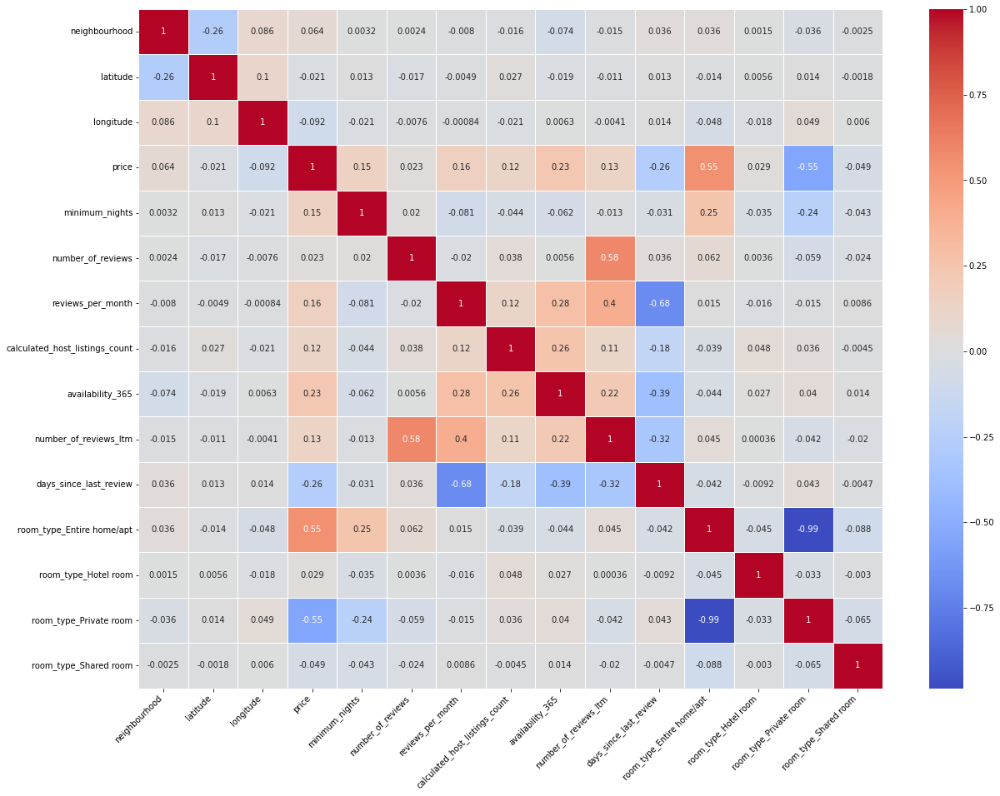

In [38]:
plt.figure(figsize = (20, 15))
# Create the heatmap
heatmap = sns.heatmap(df1.corr(), linecolor='white', linewidths=1, cmap='coolwarm', annot=True)

# Rotate the x-axis labels by 45 degrees
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, ha='right')
plt.show()

### 3.5 Model Selection

In [39]:
for key in df1.corr()['price'].keys():
        if (df1.corr()['price'][key] < 0.1) & (df1.corr()['price'][key] > -0.1):
            df1.drop(axis=1, columns=key, inplace=True)

In [40]:
df1.columns

Index(['name', 'price', 'minimum_nights', 'last_review', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365',
       'number_of_reviews_ltm', 'days_since_last_review',
       'room_type_Entire home/apt', 'room_type_Private room'],
      dtype='object')

In [41]:
df1 = df1.drop(columns=['name', 'last_review', 'reviews_per_month', 'days_since_last_review', 'room_type_Private room'])

In [42]:
df1.columns

Index(['price', 'minimum_nights', 'calculated_host_listings_count',
       'availability_365', 'number_of_reviews_ltm',
       'room_type_Entire home/apt'],
      dtype='object')

In [43]:
# Split data into features (X) and target (y)
X = df1.drop(columns=['price'])  # Assuming 'price' is the target variable
y = df1['price']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Data normalization
# from sklearn.preprocessing import MinMaxScaler
# scaler = MinMaxScaler()
# X_train = scaler.fit_transform(X_train)
# X_test = scaler.transform(X_test)


In [44]:
linear_reg = LinearRegression()
linear_reg.fit(X_train, y_train)
linear_pred = linear_reg.predict(X_test)

linear_metrics = {
    'MSE': mean_squared_error(y_test, linear_pred),
    'RMSE': mean_squared_error(y_test, linear_pred, squared=False),
    'MAE': mean_absolute_error(y_test, linear_pred),
    'R2': r2_score(y_test, linear_pred)
}

mse1 = mean_squared_error(y_test, linear_pred)
rmse1 = mean_squared_error(y_test, linear_pred, squared=False)
mae1 = mean_absolute_error(y_test, linear_pred)
r21 = r2_score(y_test, linear_pred)

print("Mean Squared Error:", mse1)
print("Root Mean Squared Error:", rmse1)
print("Mean Absolute Error:", mae1)
print("R-squared:", r21)

Mean Squared Error: 4022.2428878779206
Root Mean Squared Error: 63.42115489233794
Mean Absolute Error: 45.81377292873311
R-squared: 0.37858722964643987


In [45]:
# logistic_reg = LogisticRegression(max_iter=16)  
# logistic_reg.fit(X_train, y_train)
# logistic_pred = logistic_reg.predict(X_test)

# log_metrics = {
#     'MSE': mean_squared_error(y_test, logistic_pred),
#     'RMSE': mean_squared_error(y_test, logistic_pred, squared=False),
#     'MAE': mean_absolute_error(y_test, logistic_pred),
#     'R2': r2_score(y_test, logistic_pred)
# }

# mse2 = mean_squared_error(y_test, logistic_pred)
# rmse2 = mean_squared_error(y_test, logistic_pred, squared=False)
# mae2 = mean_absolute_error(y_test, logistic_pred)
# r22 = r2_score(y_test, logistic_pred)

# print("Mean Squared Error:", mse2)
# print("Root Mean Squared Error:", rmse2)
# print("Mean Absolute Error:", mae2)
# print("R-squared:", r22)

In [46]:
knn = KNeighborsRegressor()
knn.fit(X_train, y_train)
knn_pred = knn.predict(X_test)

knn_metrics = {
    'MSE': mean_squared_error(y_test, knn_pred),
    'RMSE': mean_squared_error(y_test, knn_pred, squared=False),
    'MAE': mean_absolute_error(y_test, knn_pred),
    'R2': r2_score(y_test, knn_pred)
}

mse3 = mean_squared_error(y_test, knn_pred)
rmse3 = mean_squared_error(y_test, knn_pred, squared=False)
mae3 = mean_absolute_error(y_test, knn_pred)
r23 = r2_score(y_test, knn_pred)

print("Mean Squared Error:", mse3)
print("Root Mean Squared Error:", rmse3)
print("Mean Absolute Error:", mae3)
print("R-squared:", r23)

Mean Squared Error: 5076.633980854039
Root Mean Squared Error: 71.25050161826258
Mean Absolute Error: 50.95538345702915
R-squared: 0.21569003313524449


In [47]:
random_forest = RandomForestRegressor()
random_forest.fit(X_train, y_train)
random_forest_pred = random_forest.predict(X_test)

random_forest_metrics = {
    'MSE': mean_squared_error(y_test, random_forest_pred),
    'RMSE': mean_squared_error(y_test, random_forest_pred, squared=False),
    'MAE': mean_absolute_error(y_test, random_forest_pred),
    'R2': r2_score(y_test, random_forest_pred)
}

mse4 = mean_squared_error(y_test, random_forest_pred)
rmse4 = mean_squared_error(y_test, random_forest_pred, squared=False)
mae4 = mean_absolute_error(y_test, random_forest_pred)
r24 = r2_score(y_test, random_forest_pred)

print("Mean Squared Error:", mse4)
print("Root Mean Squared Error:", rmse4)
print("Mean Absolute Error:", mae4)
print("R-squared:", r24)

Mean Squared Error: 4134.372759221888
Root Mean Squared Error: 64.29908832341162
Mean Absolute Error: 45.11057782003442
R-squared: 0.36126382677555924


In [48]:
gradient_boosting = GradientBoostingRegressor()
gradient_boosting.fit(X_train, y_train) 
gradient_boosting_pred = gradient_boosting.predict(X_test)

gradient_boosting_metrics = {
    'MSE': mean_squared_error(y_test, gradient_boosting_pred),
    'RMSE': mean_squared_error(y_test, gradient_boosting_pred, squared=False),
    'MAE': mean_absolute_error(y_test, gradient_boosting_pred),
    'R2': r2_score(y_test, gradient_boosting_pred)
}

mse5 = mean_squared_error(y_test, gradient_boosting_pred)
rmse5 = mean_squared_error(y_test, gradient_boosting_pred, squared=False)
mae5 = mean_absolute_error(y_test, gradient_boosting_pred)
r25 = r2_score(y_test, gradient_boosting_pred)

print("Mean Squared Error:", mse5)
print("Root Mean Squared Error:", rmse5)
print("Mean Absolute Error:", mae5)
print("R-squared:", r25)

Mean Squared Error: 3628.773041521456
Root Mean Squared Error: 60.23929814930994
Mean Absolute Error: 42.76948687243283
R-squared: 0.4393759970308877


In [49]:
xgboost = XGBRegressor()
xgboost.fit(X_train, y_train)
xgboost_pred = xgboost.predict(X_test)

xgboost_metrics = {
    'MSE': mean_squared_error(y_test, xgboost_pred),
    'RMSE': mean_squared_error(y_test, xgboost_pred, squared=False),
    'MAE': mean_absolute_error(y_test, xgboost_pred),
    'R2': r2_score(y_test, xgboost_pred)
}

mse6 = mean_squared_error(y_test, xgboost_pred)
rmse6 = mean_squared_error(y_test, xgboost_pred, squared=False)
mae6 = mean_absolute_error(y_test, xgboost_pred)
r26 = r2_score(y_test, xgboost_pred)

print("Mean Squared Error:", mse6)
print("Root Mean Squared Error:", rmse6)
print("Mean Absolute Error:", mae6)
print("R-squared:", r26)

Mean Squared Error: 3754.614740772859
Root Mean Squared Error: 61.27491118535268
Mean Absolute Error: 43.227664966127804
R-squared: 0.4199341977319222


In [50]:
results = pd.DataFrame({
    'Linear Regression': linear_metrics,
#     'Logistic Regression': log_metrics,
    'K-Nearest Neighbors': knn_metrics,
    'Random Forest': random_forest_metrics,
    'Gradient Boosting': gradient_boosting_metrics,
    'XGBoost': xgboost_metrics
})

print(results)

      Linear Regression  K-Nearest Neighbors  Random Forest  \
MSE         4022.242888          5076.633981    4134.372759   
RMSE          63.421155            71.250502      64.299088   
MAE           45.813773            50.955383      45.110578   
R2             0.378587             0.215690       0.361264   

      Gradient Boosting      XGBoost  
MSE         3628.773042  3754.614741  
RMSE          60.239298    61.274911  
MAE           42.769487    43.227665  
R2             0.439376     0.419934  


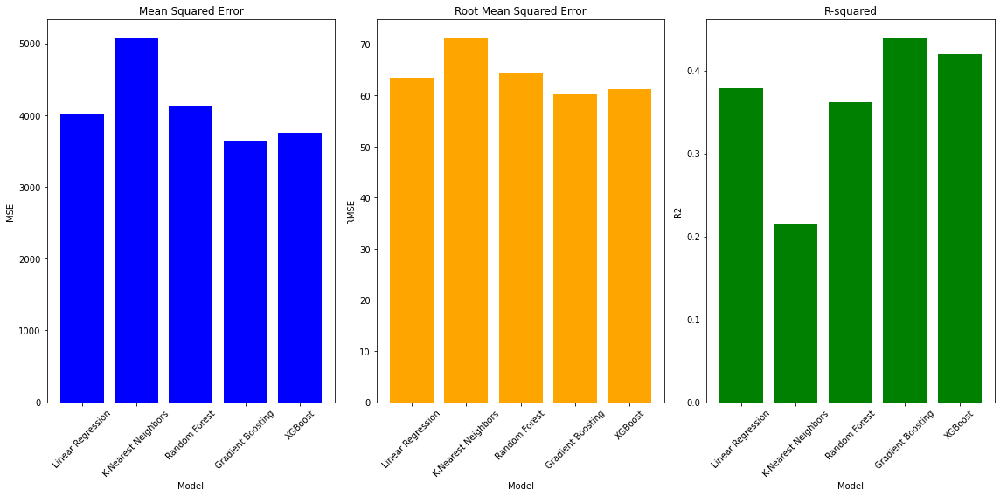

In [51]:
data = {
    'Model': ['Linear Regression',  'K-Nearest Neighbors', 'Random Forest', 'Gradient Boosting', 'XGBoost'],
    'MSE': [mse1, mse3, mse4, mse5, mse6],  
    'RMSE': [rmse1, rmse3, rmse4, rmse5, rmse6],  
    'R2': [r21, r23, r24, r25, r26]  
}

results_df = pd.DataFrame(data)

# Plotting
plt.figure(figsize=(16, 8))

plt.subplot(1, 3, 1)
plt.bar(results_df['Model'], results_df['MSE'], color='blue')
plt.xlabel('Model')
plt.ylabel('MSE')
plt.title('Mean Squared Error')
plt.xticks(rotation=45)

plt.subplot(1, 3, 2)
plt.bar(results_df['Model'], results_df['RMSE'], color='orange')
plt.xlabel('Model')
plt.ylabel('RMSE')
plt.title('Root Mean Squared Error')
plt.xticks(rotation=45)

plt.subplot(1, 3, 3)
plt.bar(results_df['Model'], results_df['R2'], color='green')
plt.xlabel('Model')
plt.ylabel('R2')
plt.title('R-squared')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [52]:
%%time
linear_reg.fit(X_train, y_train)

Wall time: 3.91 ms


LinearRegression()

In [53]:
%%time
knn.fit(X_train, y_train)

Wall time: 199 ms


KNeighborsRegressor()

In [54]:
%%time
random_forest.fit(X_train, y_train)

Wall time: 2.88 s


RandomForestRegressor()

In [55]:
%%time
gradient_boosting.fit(X_train, y_train)

Wall time: 1.08 s


GradientBoostingRegressor()

In [56]:
%%time
xgboost.fit(X_train, y_train)

Wall time: 367 ms


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)